In [1]:
import numpy as np
class BinaryTreeNode:
    def __init__(self,data):
        self.data=data
        self.left=None
        self.right=None

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
al=pd.read_csv("../Ubuntu_files/Epoch_Hackathon/Dataset.csv")
# Train:test ratio = 80:20
# Therefore, I am taking 1280 training data and 319 test data
# Here we are going to take index 960 to 1279 as test data and rest as training data
x1=pd.concat([al[:640],al[959:]])

In [3]:
# Dropping k_value, l_value, m_value, n_value features of training data
x2=x1.drop(['k_value','l_value','m_value','n_value'],axis=1)

# Extracting quality of training data in numpy array "y"
y1=x2['quality']
y2=y1.to_numpy()
y=y2.reshape(1280,1)

# Removing quality from training data
x=x2.drop('quality',axis=1).to_numpy() 

# Test data from file
te1=al[960:1279]    

# Extracting quality of test data in numpy array "teans"
teans1=te1['quality']   
teans2=teans1.to_numpy()
teans=teans2.reshape(319,1)

# Since 'quality','k_value','l_value','m_value','n_value' are removed from training data, removing it from
# test data
te=te1.drop(['quality','k_value','l_value','m_value','n_value'],axis=1).to_numpy()

In [4]:
# Removing outliers from training data
temp1=np.percentile(x,1,axis=0)
temp99=np.percentile(x,99,axis=0)
c1=0
for col in range(12):
    p_1=temp1[col]
    p_99=temp99[col]
    for i in range(1280):
        if x[i][col]>p_99:
            x=np.delete(x,i,axis=0)
            y=np.delete(y,i,axis=0)
            c1+=1
        elif x[i][col]<p_1:
            x=np.delete(x,i,axis=0)
            y=np.delete(y,i,axis=0)
            c1+=1
        if (i==1279-c1):
            break

In [5]:
# Normalization of training data along with test data
n_row=x.shape[0]
for col in range(12):
    min_col=np.Infinity
    max_col=(-1)*np.Infinity
    for row in range(n_row):
        temp1=x[row][col]
        if (temp1>max_col):
            max_col=temp1
        elif (temp1<min_col):
            min_col=temp1
    x[:,col]=(x[:,col]-min_col)/(max_col-min_col)
    te[:,col]=(te[:,col]-min_col)/(max_col-min_col)

In [8]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
clf = DecisionTreeClassifier(random_state=0)
cross_val_score(clf,x,y, cv=10)

array([0.52678571, 0.66964286, 0.57142857, 0.56756757, 0.66666667,
       0.67567568, 0.66666667, 0.7027027 , 0.72072072, 0.63063063])

In [2]:
import numpy as np

Object `np.linalg.eigval` not found.


In [3]:
np.linalg.eigvals?

In [17]:
import pandas as pd
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier

In [3]:
confusion_matrix?

In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
al=pd.read_csv("../Ubuntu_files/Epoch_Hackathon/Dataset.csv")

In [8]:
al1=al.to_numpy()
al1

array([[ 7.4       ,  0.7       ,  0.        , ...,  0.636     ,
        30.90909091,  0.608     ],
       [ 7.8       ,  0.88      ,  0.        , ...,  0.778     ,
        26.8       ,  0.829     ],
       [ 7.8       ,  0.76      ,  0.04      , ...,  0.742     ,
        36.        ,  0.744     ],
       ...,
       [ 6.3       ,  0.51      ,  0.13      , ...,  0.826     ,
        13.79310345,  0.754     ],
       [ 5.9       ,  0.645     ,  0.12      , ...,  0.785     ,
        13.75      ,  0.6615    ],
       [ 6.        ,  0.31      ,  0.47      , ...,  0.727     ,
        23.33333333,  1.2075    ]])

In [9]:
al1[:,11]

array([0., 0., 0., ..., 1., 0., 1.])

In [10]:
al1=al['quality']

In [11]:
al1

0       0
1       0
2       0
3       1
4       0
       ..
1594    0
1595    1
1596    1
1597    0
1598    1
Name: quality, Length: 1599, dtype: int64

In [12]:
al_te=al.drop('quality',axis=1)

In [87]:
al_te.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,k_value,l_value,m_value,percentage_free_sulphur,n_value
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,8.10,4.05,0.636,30.909091,0.6080
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,8.68,4.34,0.778,26.800000,0.8290
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,8.56,4.28,0.742,36.000000,0.7440
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,11.48,5.74,0.655,35.294118,0.7195
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,8.10,4.05,0.636,30.909091,0.6080


In [14]:
X_train, X_test, y_train, y_test = train_test_split(al_te,al1,test_size=0.2, random_state=42)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,k_value,l_value,m_value,percentage_free_sulphur,n_value
803,7.7,0.560,0.08,2.50,0.114,14.0,46.0,0.99710,3.24,0.66,9.6,8.260,4.1300,0.774,32.857143,0.8230
124,7.8,0.500,0.17,1.60,0.082,21.0,102.0,0.99600,3.39,0.48,9.5,8.300,4.1500,0.562,48.571429,0.5550
350,10.7,0.670,0.22,2.70,0.107,17.0,34.0,1.00040,3.28,0.98,9.9,11.370,5.6850,1.087,20.000000,0.9075
682,8.5,0.460,0.31,2.25,0.078,32.0,58.0,0.99800,3.33,0.54,9.8,8.960,4.4800,0.618,18.125000,0.7760
1326,6.7,0.460,0.24,1.70,0.077,18.0,34.0,0.99480,3.39,0.60,10.6,7.160,3.5800,0.677,18.888889,0.5965
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1259,6.8,0.640,0.00,2.70,0.123,15.0,33.0,0.99538,3.44,0.63,11.3,7.440,3.7200,0.753,22.000000,0.8715
1295,6.6,0.630,0.00,4.30,0.093,51.0,77.5,0.99558,3.20,0.45,9.5,7.230,3.6150,0.543,15.196078,1.3365
1155,8.3,0.600,0.25,2.20,0.118,9.0,38.0,0.99616,3.15,0.53,9.8,8.900,4.4500,0.648,42.222222,0.7690
963,8.8,0.270,0.39,2.00,0.100,20.0,27.0,0.99546,3.15,0.69,11.2,9.070,4.5350,0.790,13.500000,0.7280


In [94]:
wine_clf=DecisionTreeClassifier(max_leaf_nodes=13,random_state=0)
wine_clf.fit(X_train,y_train)

DecisionTreeClassifier(max_leaf_nodes=13, random_state=0)

In [95]:
y_pred=wine_clf.predict(X_test)

In [96]:
accuracy_score(y_test,y_pred)*100

75.0

In [83]:
confusion_matrix(y_test,y_pred)

array([[118,  23],
       [ 57, 122]], dtype=int64)

In [84]:
from sklearn.tree import export_graphviz
from six import StringIO
from IPython.display import Image 
import pydotplus

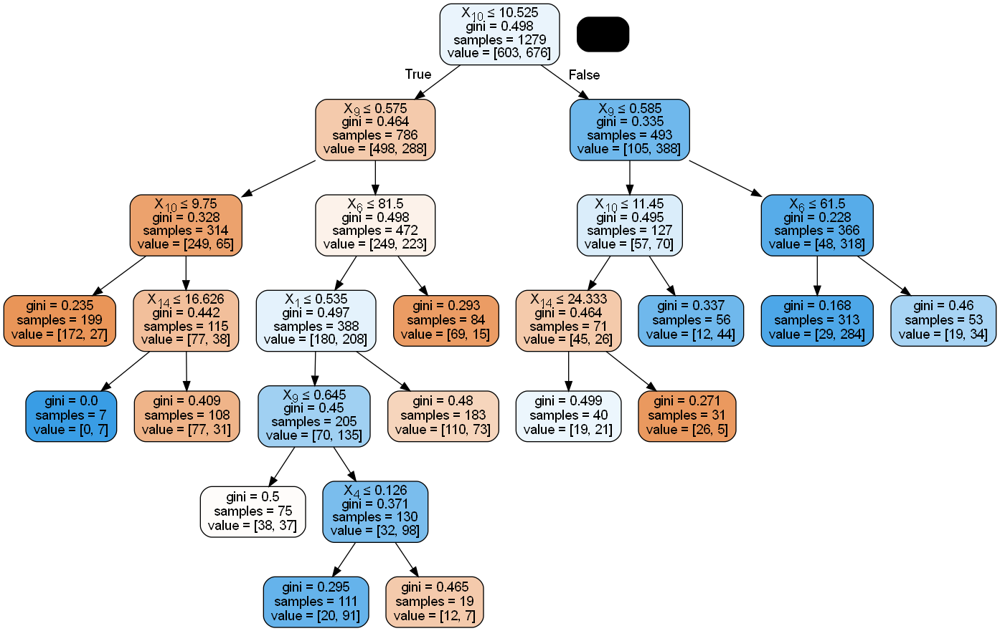

In [85]:
dot_data = StringIO()
export_graphviz(wine_clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

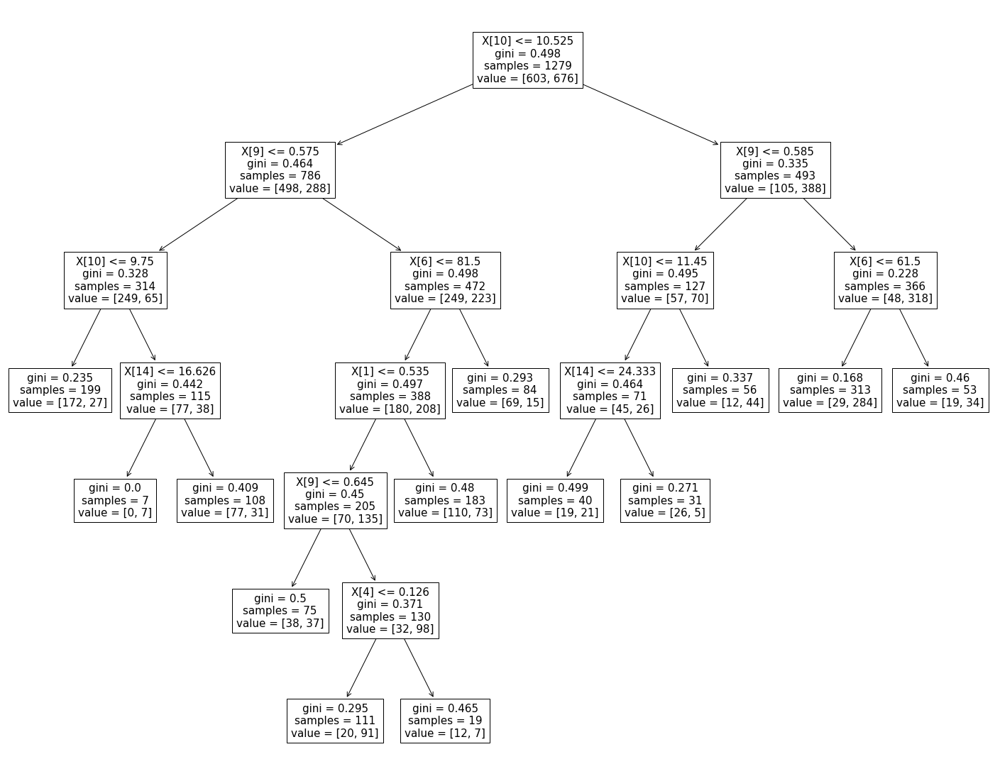

In [86]:
from sklearn.tree import plot_tree
fig = plt.figure(figsize=(25,20))
_ = plot_tree(wine_clf)
fig.savefig("wine_tree.png")

# Scaling Using Sklearn

In [88]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
X_train=sc.fit_transform(X_train)
X_test=sc.fit_transform(X_test)

In [93]:
X_test[:3]

array([[-0.33399129,  0.24258119, -0.96313679,  0.02140418,  0.83730066,
        -0.16962178,  0.00884052,  0.23074469, -0.44256111,  0.0634928 ,
        -0.75508835, -0.31840043, -0.31840043,  0.24575389, -0.03247573,
        -0.03388868],
       [-0.27864317, -0.09492307, -0.49458376, -0.6712254 , -0.04244065,
         0.46521996,  1.72151211, -0.31812766,  0.51996419, -1.15964614,
        -0.84471308, -0.29567022, -0.29567022, -1.06328693,  0.55967718,
        -0.71024275],
       [ 1.32645219,  0.86133899, -0.23427652,  0.17532186,  0.64485725,
         0.10245325, -0.35816054,  1.87736173, -0.1858877 ,  2.23796204,
        -0.48621416,  1.44887288,  1.44887288,  2.17844152, -0.51696447,
         0.17936474]])

# Random Forest Sklearn

In [198]:
from sklearn.ensemble import RandomForestClassifier
wine_rn_clf=RandomForestClassifier(n_estimators=30,random_state=0)
wine_rn_clf.fit(X_train,y_train)
y_pred_rn=wine_rn_clf.predict(X_test)
# li.append(accuracy_score(y_test,y_pred_rn)*100)

In [199]:
max(li)

77.5

In [200]:
accuracy_score(y_test,y_pred_rn)*100

78.125

In [201]:
from sklearn.metrics import classification_report
clf_rep_rnforest=classification_report(y_test, y_pred_rn)

In [202]:
print(clf_rep_rnforest)

              precision    recall  f1-score   support

           0       0.73      0.81      0.77       141
           1       0.83      0.76      0.80       179

    accuracy                           0.78       320
   macro avg       0.78      0.78      0.78       320
weighted avg       0.79      0.78      0.78       320



In [203]:
confusion_matrix(y_test,y_pred_rn)

array([[114,  27],
       [ 43, 136]], dtype=int64)

In [186]:
from sklearn.tree import export_graphviz
# Export as dot file
estimator = wine_rn_clf.estimators_[5]
export_graphviz(estimator, out_file='tree.dot', 
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

In [188]:
wine_rn_clf.

RandomForestClassifier(n_estimators=20, random_state=0)